<a id="top"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#003d99;overflow:hidden"><b>Explain instruct  PIX2PIX diffusion base</b></div>

<a id="top"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#003d99;overflow:hidden"><b>Required Library</b></div>

In [1]:
!git clone https://github.com/huggingface/transformers.git

Cloning into 'transformers'...
remote: Enumerating objects: 238388, done.
remote: Counting objects: 100% (1691/1691), done.
remote: Compressing objects: 100% (648/648), done.
remote: Total 238388 (delta 1203), reused 1350 (delta 944), pack-reused 236697 (from 1)
Receiving objects: 100% (238388/238388), 252.00 MiB | 27.66 MiB/s, done.
Resolving deltas: 100% (174059/174059), done.


In [2]:
!pip install diffusers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 31.6 MB/s eta 0:00:0000:010:01


In [3]:
!pip install sentence-transformers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 255.8/255.8 kB 5.2 MB/s eta 0:00:00a 0:00:01


In [4]:
!pip install torch

In [5]:
!pip install pot

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 835.4/835.4 kB 15.9 MB/s eta 0:00:00a 0:00:01


In [6]:
from diffusers import DiffusionPipeline, StableDiffusionInstructPix2PixPipeline, EulerAncestralDiscreteScheduler
import torch
from PIL import Image
import requests
from io import BytesIO

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

from sentence_transformers import SentenceTransformer

import os

from diffusers import StableDiffusionInstructPix2PixPipeline, EulerAncestralDiscreteScheduler
from PIL import Image
from IPython.display import display, Image as Image2
import sys
from transformers import AutoImageProcessor, AutoModel
from PIL import Image
import requests
import cv2
from sklearn.decomposition import TruncatedSVD

from sklearn.linear_model import LinearRegression
from scipy.spatial.distance import cosine
import matplotlib.pyplot as plt
from matplotlib import transforms
import torch
import os
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.linear_model import Lasso
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import Ridge
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from itertools import chain, combinations
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from scipy.stats import wasserstein_distance
from gensim.models import KeyedVectors
from gensim.downloader import load as api_load
from gensim.models import KeyedVectors
from sklearn.metrics.pairwise import euclidean_distances
from scipy.spatial.distance import cdist
from transformers import AutoTokenizer, AutoModel
import torch
import tensorflow as tf
from gensim.models import KeyedVectors
from torch import Generator
import warnings
warnings.filterwarnings('ignore')

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [7]:
#Instruct PIX2PIX
# Initialize the model and pipeline
model_name = "timbrooks/instruct-pix2pix"
pipe = StableDiffusionInstructPix2PixPipeline.from_pretrained(model_name, torch_dtype=torch.float16)
device = "cuda"
pipe.to(device)

model_index.json:   0%|          | 0.00/616 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

text_encoder/config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/518 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.91k [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/569 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.02k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/553 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

StableDiffusionInstructPix2PixPipeline {
  "_class_name": "StableDiffusionInstructPix2PixPipeline",
  "_diffusers_version": "0.31.0",
  "_name_or_path": "timbrooks/instruct-pix2pix",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": false,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "EulerAncestralDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [8]:
#DinoV2
processor = AutoImageProcessor.from_pretrained("facebook/dinov2-base")
model = AutoModel.from_pretrained("facebook/dinov2-base")

preprocessor_config.json:   0%|          | 0.00/436 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

In [9]:
#Word2Vec model
model_path_bin = '/kaggle/input/google_word__/tensorflow2/default/1/GoogleNews-vectors-negative300.bin'
model_txt = KeyedVectors.load_word2vec_format(model_path_bin, binary=True)


<a id="top"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#003d99;overflow:hidden"><b>Inputs</b></div>

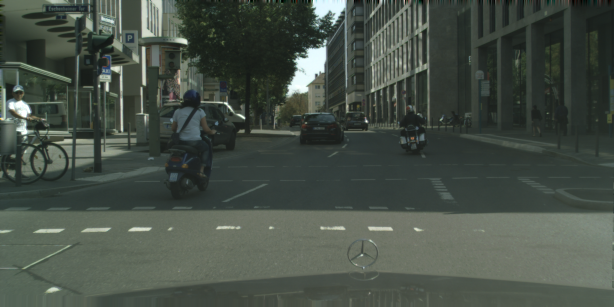

In [11]:
# Load the initial image
url = "/kaggle/input/30images/4(1).png"
init_image = Image.open(url)
display(init_image)

In [12]:
cfg_image = 7.5 # This controls how much the output should resemble the original image
cfg_text = 1.5 # This controls how much the output should follow the text prompt

In [13]:
prompt = "Transform the wethear to make it snowing"
words = prompt.split()
words

['Transform', 'the', 'wethear', 'to', 'make', 'it', 'snowing']

<a id="top"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#003d99;overflow:hidden"><b>Generate Original Image with original prompt</b></div>

  0%|          | 0/100 [00:00<?, ?it/s]

Wasserstein distance: 0.024922187051060966


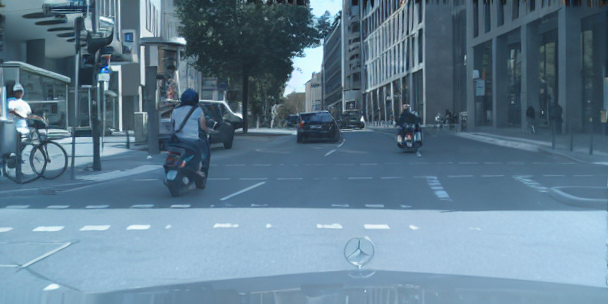

Image generation complete with acceptable Wasserstein distance!


In [14]:
def extract_image_embedding(image, processor, model):
    """Extract embeddings from an image using the DINOv2 model."""
    inputs = processor(images=image, return_tensors="pt")
    with torch.no_grad():
        outputs = model(**inputs)
    embeddings = outputs.last_hidden_state.mean(dim=1).squeeze().cpu().numpy()
    return embeddings

# Set initial Wasserstein distance to a large number
WD_dist_init = float('inf')

# Repeat generation process until Wasserstein distance is less than 0.1
while WD_dist_init > 0.07:
    # Generate the image
    orig_image = pipe(
        prompt=prompt, 
        image=init_image, 
        cfg_image=cfg_image, 
        cfg_text=cfg_text, 
    ).images[0]
    
    
    # Extract embeddings for the original image and initial image
    orig_embedding = extract_image_embedding(orig_image, processor, model)
    init_embedding = extract_image_embedding(init_image, processor, model)
    
    # Calculate Wasserstein distance between the embeddings
    WD_dist_init = wasserstein_distance(orig_embedding, init_embedding)

    print(f'Wasserstein distance: {WD_dist_init}')

    # Save and display the image only if the distance is acceptable
    if WD_dist_init <= 0.07:
        output_path = '/kaggle/working/orig_image.png'  # Set the output path
        orig_image.save(output_path)
        display(orig_image)

print("Image generation complete with acceptable Wasserstein distance!")


<a id="top"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#003d99;overflow:hidden"><b>Generate Perturbaed texts & perturbed Images & compute WD distances between embeddings</b></div>

In [15]:
seed = 1024
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)  # If you're using GPU
torch.backends.cudnn.deterministic = True  # Ensures reproducibility for cuDNN
torch.backends.cudnn.benchmark = False  # Disables the optimized path for better reproducibility
# Set up the text-to-image generator with seed
generator = torch.Generator().manual_seed(seed)

def perturb_text(text_list, perturbation, rng):
    # Initially select items based on perturbation flag
    perturbed_list_initial = [item for item, flag in zip(text_list, perturbation) if flag != 0 and item.strip() != ""]
    
    # Ensure at least two words are included
    if len(perturbed_list_initial) < 2:
        additional_words_needed = 2 - len(perturbed_list_initial)
        available_words = [item for item, flag in zip(text_list, perturbation) if item not in perturbed_list_initial and item.strip() != ""]
        additional_words = rng.choice(available_words, additional_words_needed, replace=False)
        perturbed_list = perturbed_list_initial + list(additional_words)
    else:
        perturbed_list = perturbed_list_initial
    
    return perturbed_list

# Assuming `prompt` and other variables are predefined
words = prompt.split()
text_list = words.copy()

num_perturb = 50
num_words = len(words)

Responses = []
Perturbations = []
# Generate unique perturbations
unique_perturbations = set()
rng = np.random.default_rng(seed)

while len(unique_perturbations) < num_perturb:
    perturbation = tuple(rng.binomial(1, 0.5, size=num_words))  # Convert to tuple for set operations
    
    # Check for uniqueness
    if perturbation not in unique_perturbations:
        unique_perturbations.add(perturbation)
        perturbed_txt = perturb_text(text_list, perturbation, rng)
        corpus = ' '.join(perturbed_txt)
        Responses.append(corpus)  # Store the unique perturbed text
        Perturbations.append(perturbation)  # Store the perturbation vector
        print(f"Perturbation: {perturbation}, Perturbed Text: {corpus}")


Perturbation: (0, 0, 0, 1, 1, 0, 1), Perturbed Text: to make snowing
Perturbation: (1, 1, 0, 1, 0, 1, 0), Perturbed Text: Transform the to it
Perturbation: (1, 0, 1, 1, 1, 0, 1), Perturbed Text: Transform wethear to make snowing
Perturbation: (0, 1, 1, 0, 1, 1, 1), Perturbed Text: the wethear make it snowing
Perturbation: (0, 0, 1, 0, 0, 0, 0), Perturbed Text: wethear to
Perturbation: (1, 1, 1, 1, 1, 1, 0), Perturbed Text: Transform the wethear to make it
Perturbation: (0, 1, 0, 0, 0, 1, 0), Perturbed Text: the it
Perturbation: (1, 0, 0, 0, 1, 1, 1), Perturbed Text: Transform make it snowing
Perturbation: (0, 0, 1, 1, 1, 1, 0), Perturbed Text: wethear to make it
Perturbation: (1, 1, 1, 0, 0, 0, 1), Perturbed Text: Transform the wethear snowing
Perturbation: (1, 0, 1, 0, 0, 0, 1), Perturbed Text: Transform wethear snowing
Perturbation: (1, 0, 0, 0, 0, 0, 0), Perturbed Text: Transform it
Perturbation: (1, 1, 1, 0, 0, 0, 0), Perturbed Text: Transform the wethear
Perturbation: (1, 1, 0, 0,

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 1:
Wasserstein distance (generated vs init): 0.03553456722481009
Wasserstein distance (generated vs orig): 0.015099595096065361


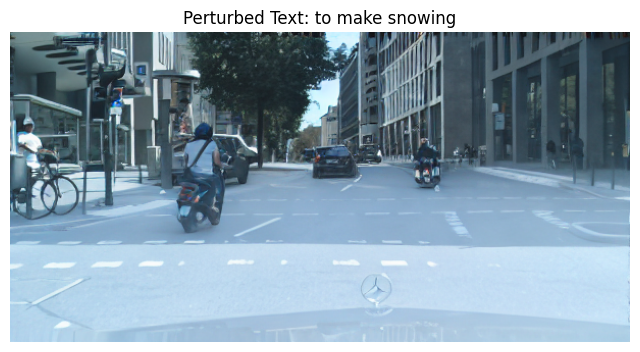

Image generation 1 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 2:
Wasserstein distance (generated vs init): 0.024916440391280048
Wasserstein distance (generated vs orig): 0.009081212326880934


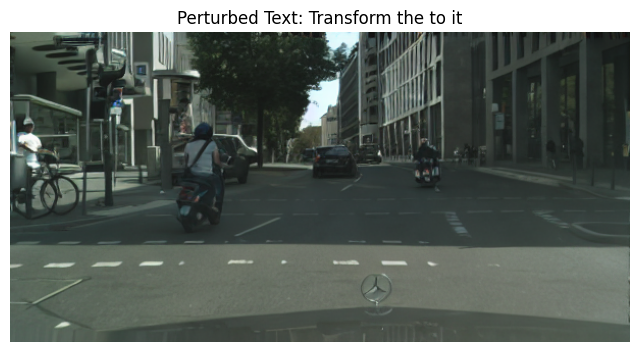

Image generation 2 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 3:
Wasserstein distance (generated vs init): 0.026207028072652357
Wasserstein distance (generated vs orig): 0.011351771459582473


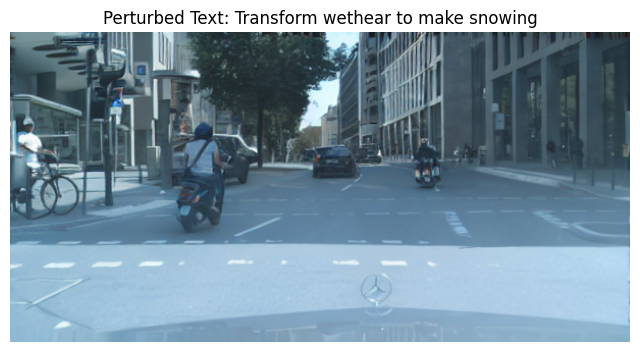

Image generation 3 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 4:
Wasserstein distance (generated vs init): 0.025882215733417955
Wasserstein distance (generated vs orig): 0.01362472234025821


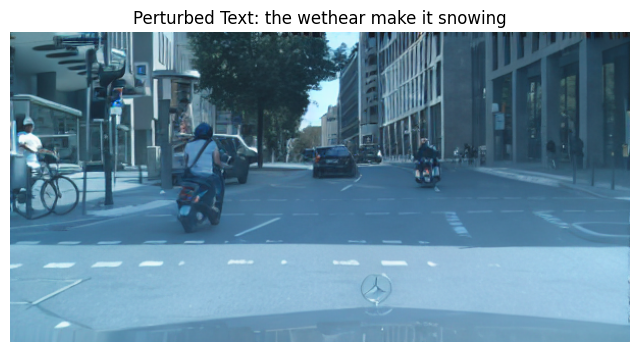

Image generation 4 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 5:
Wasserstein distance (generated vs init): 0.024165120114275858
Wasserstein distance (generated vs orig): 0.008260496765842618


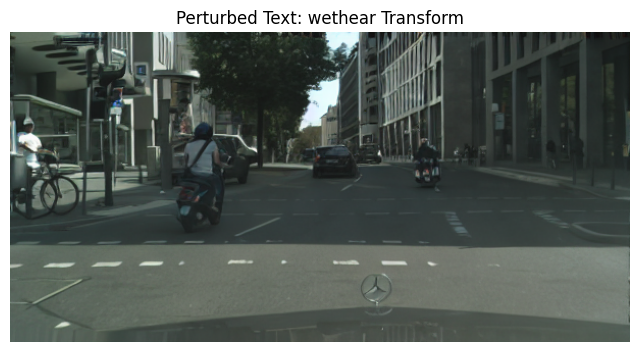

Image generation 5 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 6:
Wasserstein distance (generated vs init): 0.025017749841329838
Wasserstein distance (generated vs orig): 0.008037954485644155


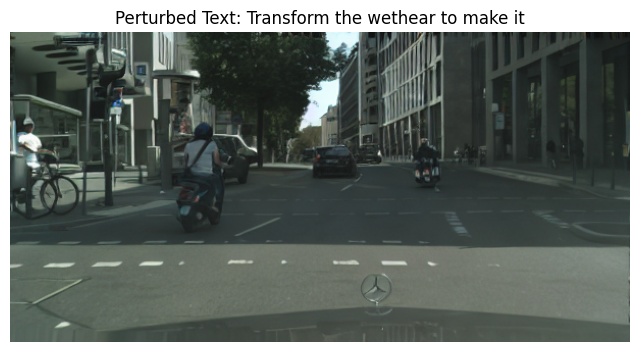

Image generation 6 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 7:
Wasserstein distance (generated vs init): 0.022940273238115576
Wasserstein distance (generated vs orig): 0.011284726290038339


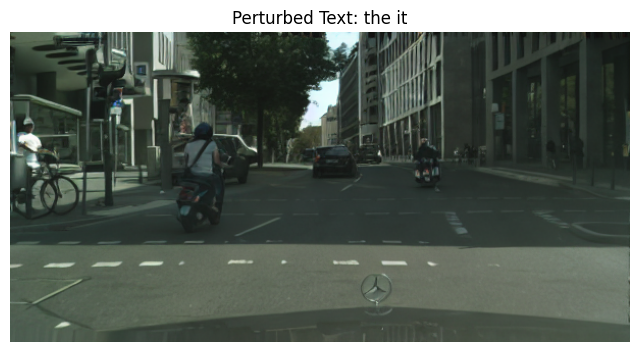

Image generation 7 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 8:
Wasserstein distance (generated vs init): 0.024661240285392207
Wasserstein distance (generated vs orig): 0.013935174098681592


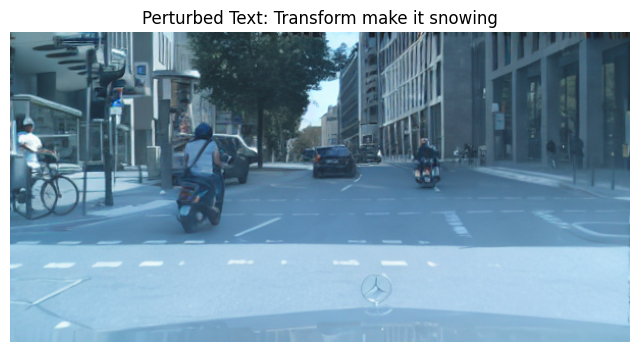

Image generation 8 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 9:
Wasserstein distance (generated vs init): 0.023913861139590153
Wasserstein distance (generated vs orig): 0.00794398009111319


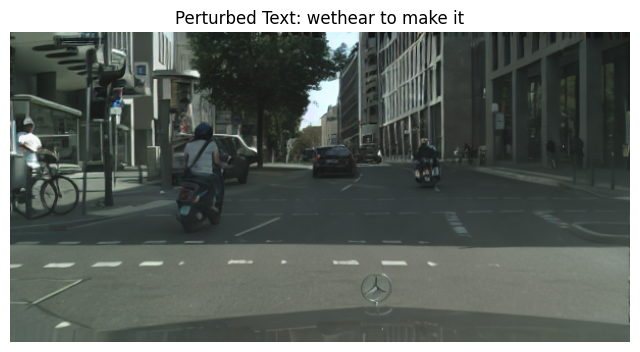

Image generation 9 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 10:
Wasserstein distance (generated vs init): 0.025373905152756986
Wasserstein distance (generated vs orig): 0.016828144400847116


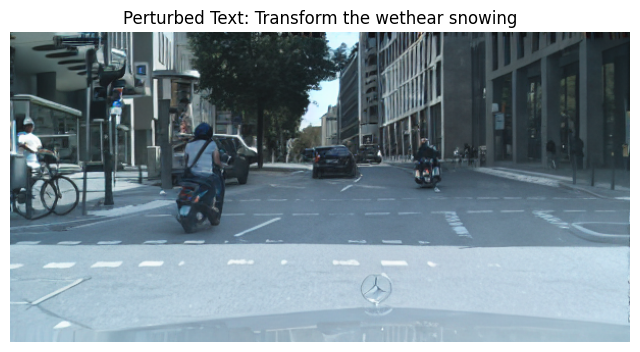

Image generation 10 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 11:
Wasserstein distance (generated vs init): 0.028050904073324986
Wasserstein distance (generated vs orig): 0.00967823007014583


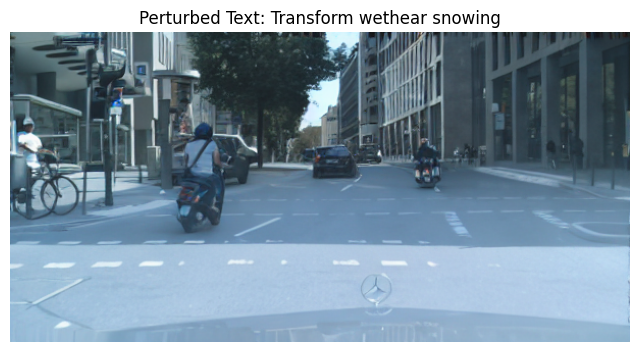

Image generation 11 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 12:
Wasserstein distance (generated vs init): 0.023791142507889163
Wasserstein distance (generated vs orig): 0.007931877863484264


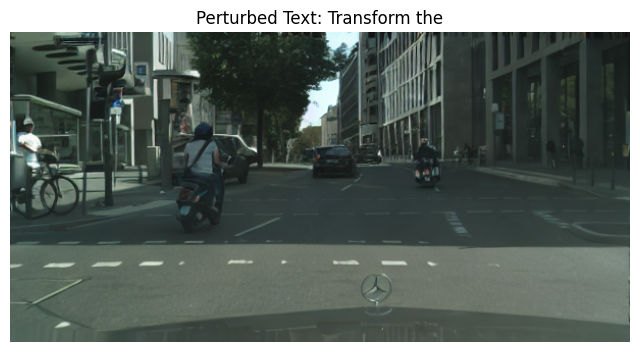

Image generation 12 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 13:
Wasserstein distance (generated vs init): 0.024121631148773297
Wasserstein distance (generated vs orig): 0.00930463750520023


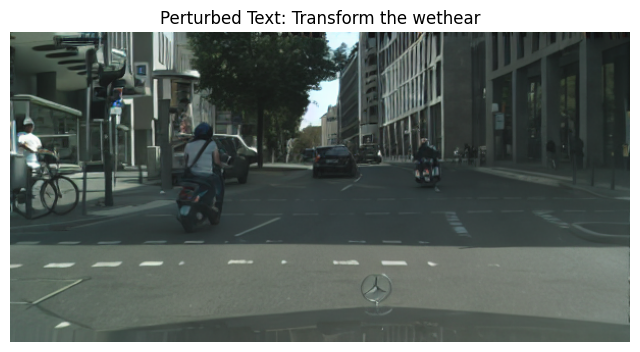

Image generation 13 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 14:
Wasserstein distance (generated vs init): 0.025235467685433825
Wasserstein distance (generated vs orig): 0.008501252015776116


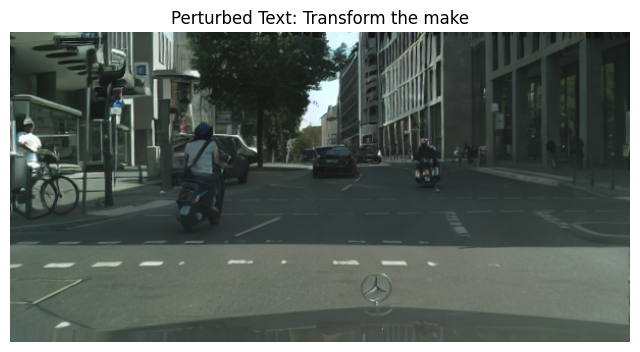

Image generation 14 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 15:
Wasserstein distance (generated vs init): 0.02491938621748583
Wasserstein distance (generated vs orig): 0.0168710304161929


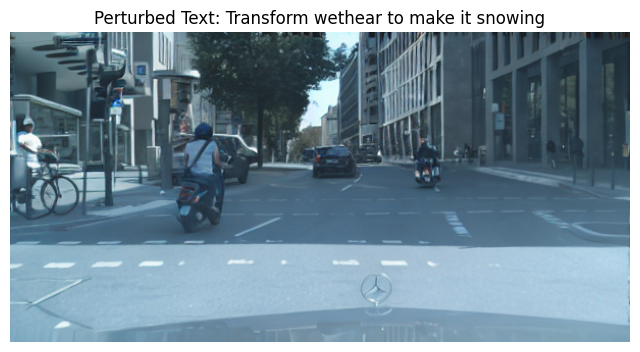

Image generation 15 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 16:
Wasserstein distance (generated vs init): 0.045470220685426
Wasserstein distance (generated vs orig): 0.02679390652474465


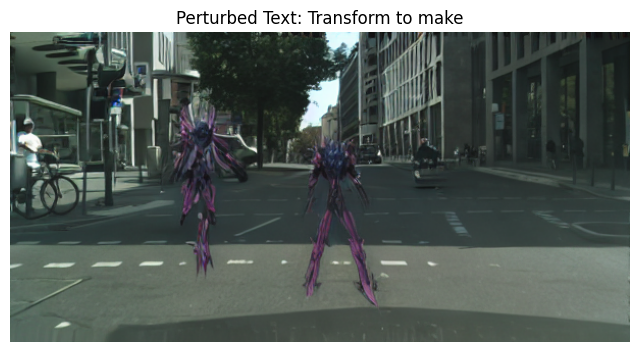

Image generation 16 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 17:
Wasserstein distance (generated vs init): 0.024616136748666875
Wasserstein distance (generated vs orig): 0.010270221271071026


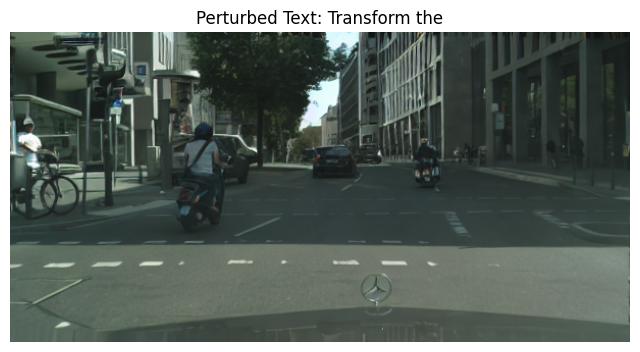

Image generation 17 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 18:
Wasserstein distance (generated vs init): 0.02279107365886072
Wasserstein distance (generated vs orig): 0.006835831453296739


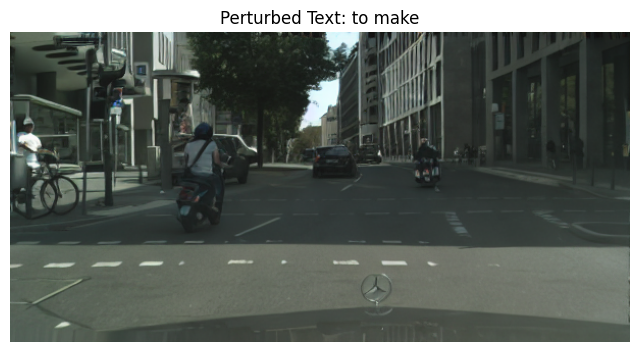

Image generation 18 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 19:
Wasserstein distance (generated vs init): 0.028351826464510517
Wasserstein distance (generated vs orig): 0.012985119476600929


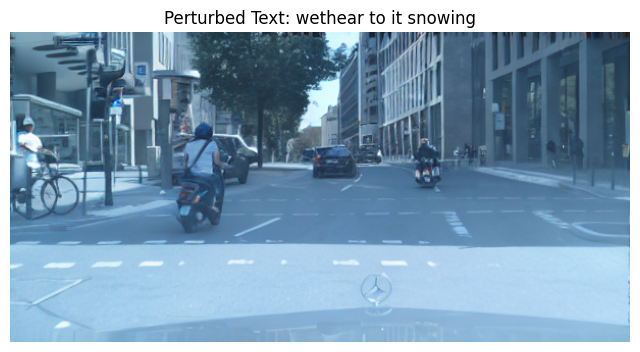

Image generation 19 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 20:
Wasserstein distance (generated vs init): 0.02466271175273959
Wasserstein distance (generated vs orig): 0.008924657301562885


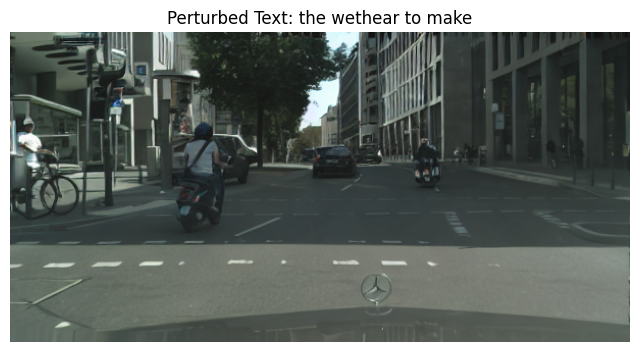

Image generation 20 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 21:
Wasserstein distance (generated vs init): 0.02373201670555622
Wasserstein distance (generated vs orig): 0.014427135582271447


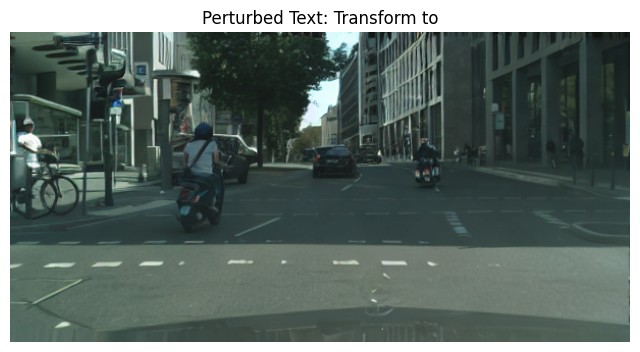

Image generation 21 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 22:
Wasserstein distance (generated vs init): 0.024807387827432113
Wasserstein distance (generated vs orig): 0.013920126973507266


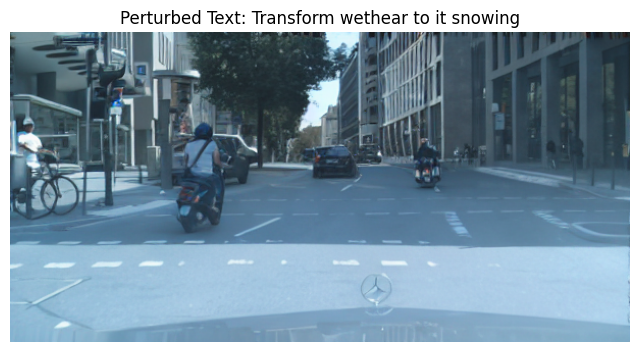

Image generation 22 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 23:
Wasserstein distance (generated vs init): 0.024072508055724036
Wasserstein distance (generated vs orig): 0.007709904999349718


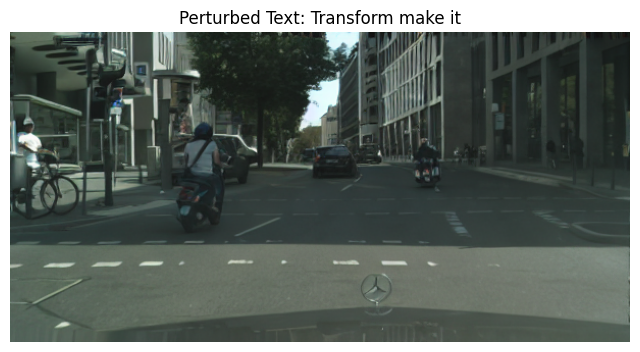

Image generation 23 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 24:
Wasserstein distance (generated vs init): 0.025640151692025867
Wasserstein distance (generated vs orig): 0.008889587522531885


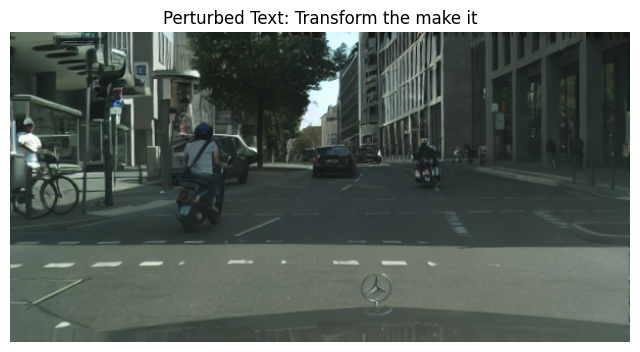

Image generation 24 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 25:
Wasserstein distance (generated vs init): 0.027259361530923325
Wasserstein distance (generated vs orig): 0.011661781085194892


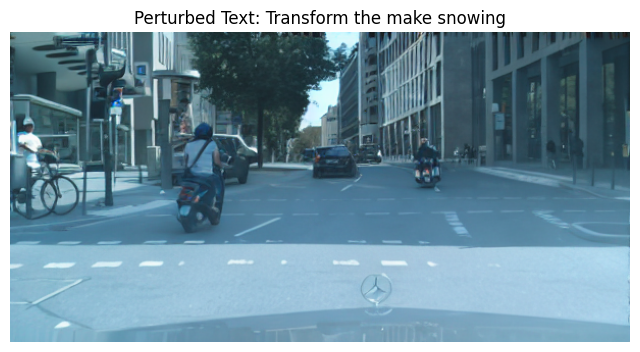

Image generation 25 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 26:
Wasserstein distance (generated vs init): 0.029006120531363394
Wasserstein distance (generated vs orig): 0.01742123050938932


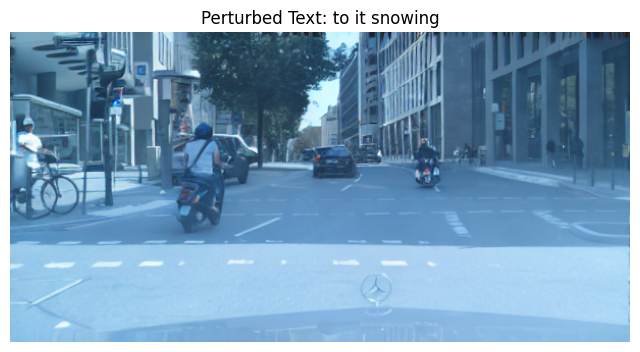

Image generation 26 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 27:
Wasserstein distance (generated vs init): 0.027157969633705648
Wasserstein distance (generated vs orig): 0.00897370288790001


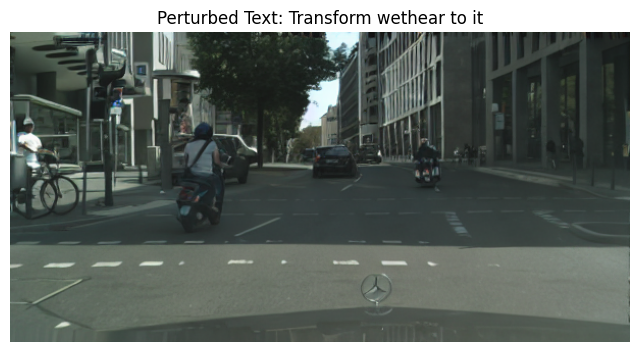

Image generation 27 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 28:
Wasserstein distance (generated vs init): 0.02500487040348768
Wasserstein distance (generated vs orig): 0.007788334628761126


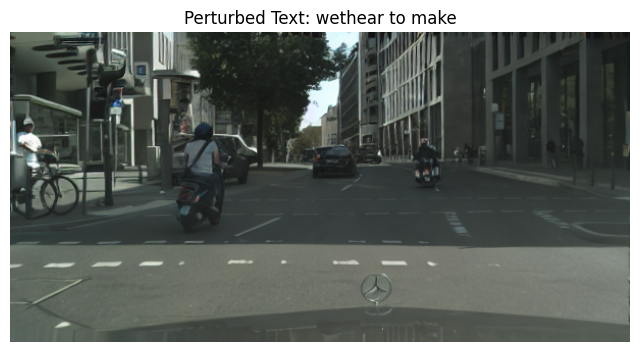

Image generation 28 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 29:
Wasserstein distance (generated vs init): 0.02604227450115104
Wasserstein distance (generated vs orig): 0.008553610519432679


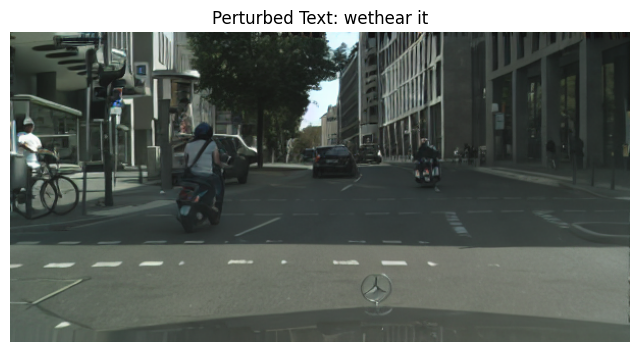

Image generation 29 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 30:
Wasserstein distance (generated vs init): 0.023619579018334964
Wasserstein distance (generated vs orig): 0.00780802400383134


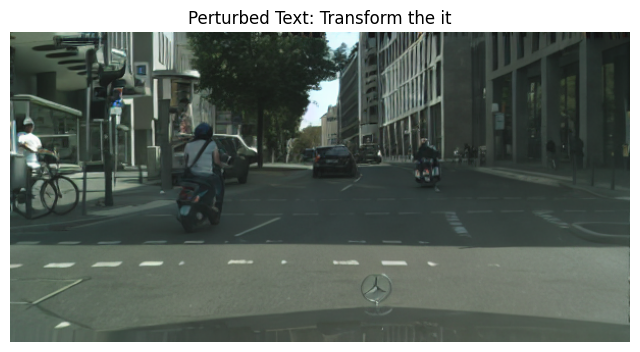

Image generation 30 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 31:
Wasserstein distance (generated vs init): 0.02525290338962804
Wasserstein distance (generated vs orig): 0.00939321327950892


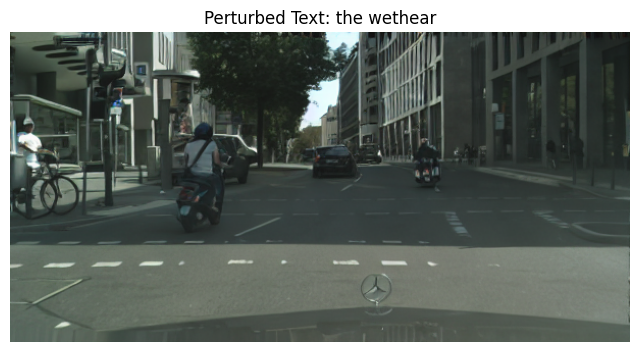

Image generation 31 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 32:
Wasserstein distance (generated vs init): 0.02420590347440072
Wasserstein distance (generated vs orig): 0.015833139978676997


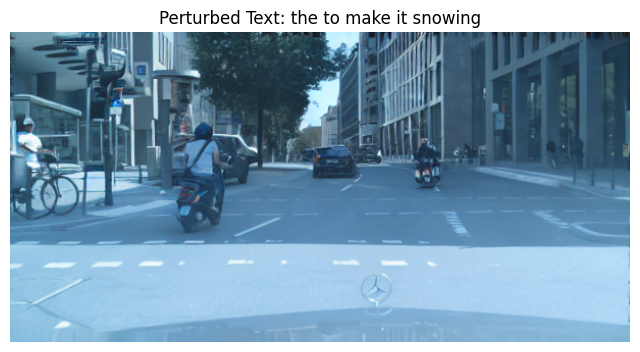

Image generation 32 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 33:
Wasserstein distance (generated vs init): 0.025175068082717182
Wasserstein distance (generated vs orig): 0.008299436020062482


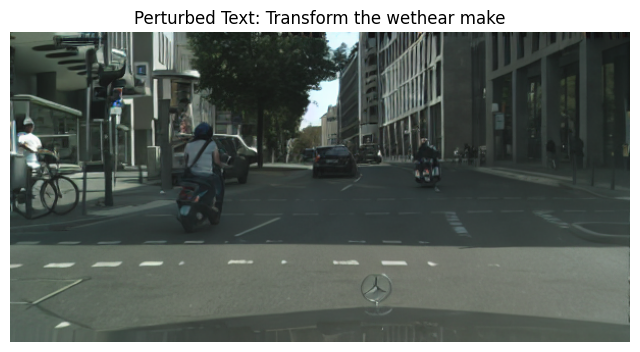

Image generation 33 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 34:
Wasserstein distance (generated vs init): 0.025821936678767095
Wasserstein distance (generated vs orig): 0.008751519045186264


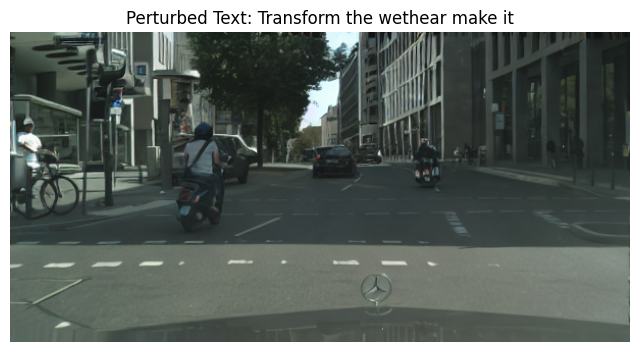

Image generation 34 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 35:
Wasserstein distance (generated vs init): 0.02817557096176295
Wasserstein distance (generated vs orig): 0.012483809439855765


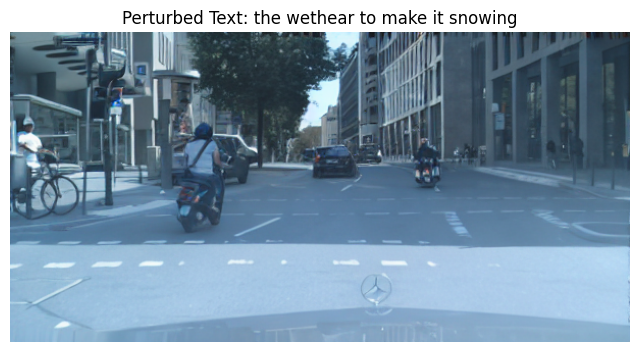

Image generation 35 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 36:
Wasserstein distance (generated vs init): 0.029665533282695833
Wasserstein distance (generated vs orig): 0.013278100872867071


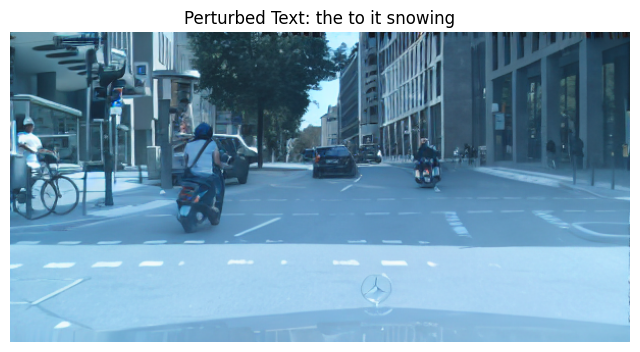

Image generation 36 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 37:
Wasserstein distance (generated vs init): 0.023817343257330013
Wasserstein distance (generated vs orig): 0.010970348085417466


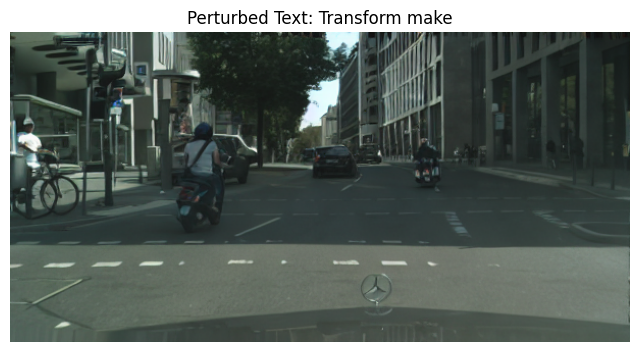

Image generation 37 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 38:
Wasserstein distance (generated vs init): 0.023673911394022668
Wasserstein distance (generated vs orig): 0.016165745341822926


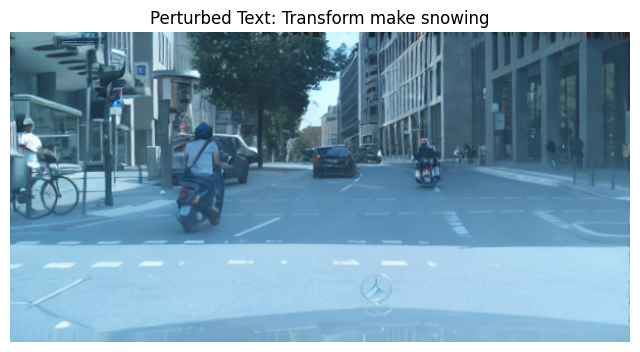

Image generation 38 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 39:
Wasserstein distance (generated vs init): 0.023540615204259027
Wasserstein distance (generated vs orig): 0.010755622179885908


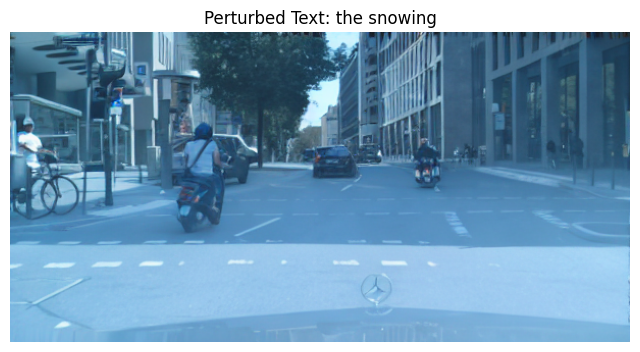

Image generation 39 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 40:
Wasserstein distance (generated vs init): 0.029567972890921116
Wasserstein distance (generated vs orig): 0.014879091113167917


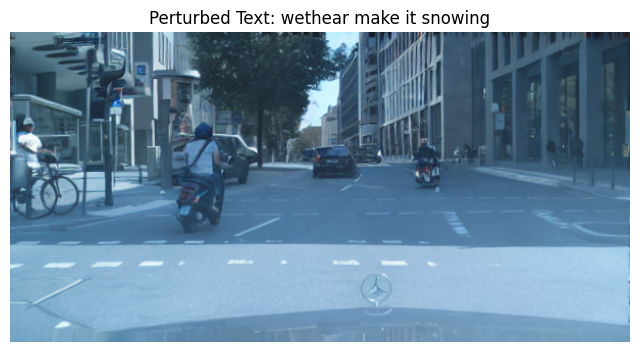

Image generation 40 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 41:
Wasserstein distance (generated vs init): 0.03667417199797758
Wasserstein distance (generated vs orig): 0.019312445246365932


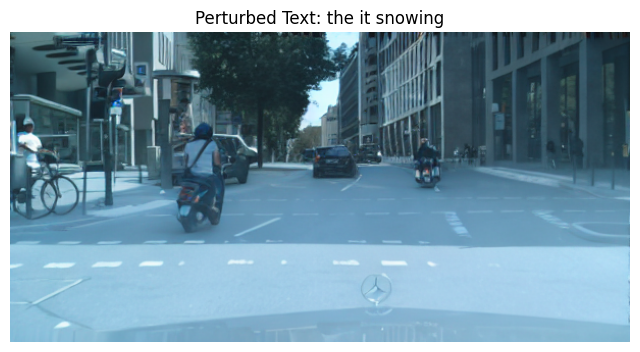

Image generation 41 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 42:
Wasserstein distance (generated vs init): 0.025782848714698027
Wasserstein distance (generated vs orig): 0.012038866050716024


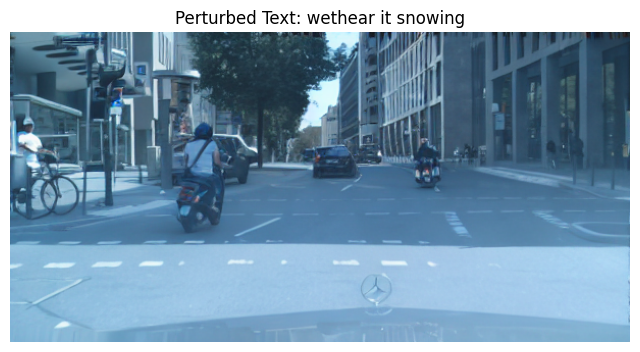

Image generation 42 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 43:
Wasserstein distance (generated vs init): 0.024414258912656785
Wasserstein distance (generated vs orig): 0.012691656631470028


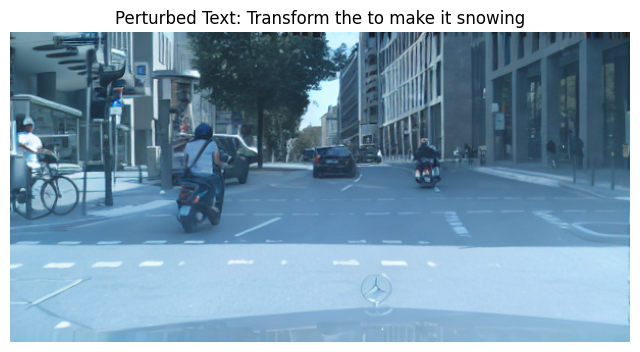

Image generation 43 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 44:
Wasserstein distance (generated vs init): 0.02481689218397303
Wasserstein distance (generated vs orig): 0.008445540074490054


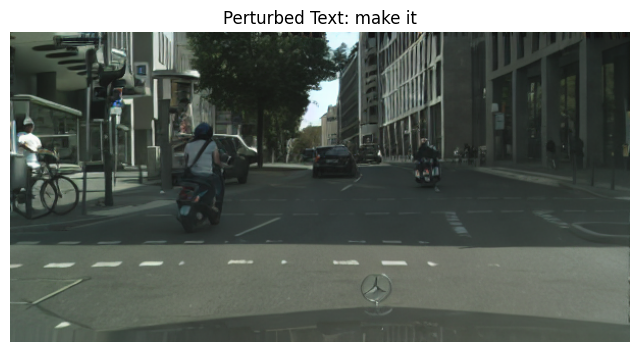

Image generation 44 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 45:
Wasserstein distance (generated vs init): 0.025628215951693768
Wasserstein distance (generated vs orig): 0.00864061151568999


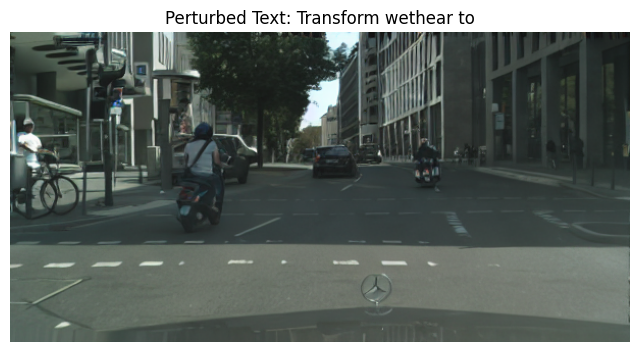

Image generation 45 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 46:
Wasserstein distance (generated vs init): 0.029323486381751213
Wasserstein distance (generated vs orig): 0.01670042585980506


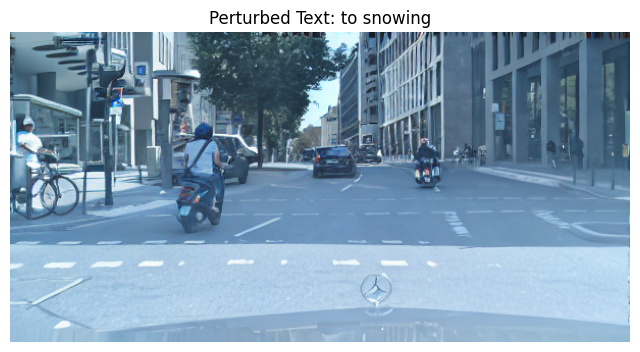

Image generation 46 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 47:
Wasserstein distance (generated vs init): 0.026634962837382155
Wasserstein distance (generated vs orig): 0.014514025505150123


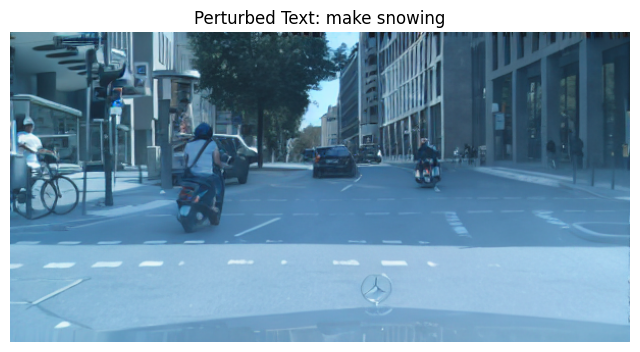

Image generation 47 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 48:
Wasserstein distance (generated vs init): 0.022083449393752147
Wasserstein distance (generated vs orig): 0.01886451628721867


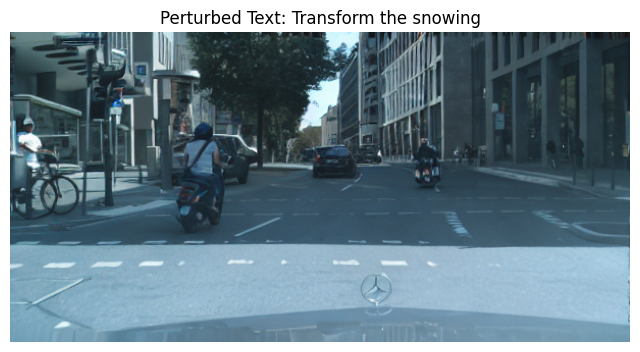

Image generation 48 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 49:
Wasserstein distance (generated vs init): 0.02746455325541318
Wasserstein distance (generated vs orig): 0.012780921259945904


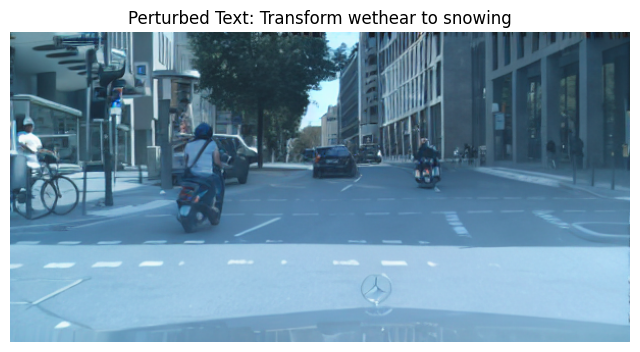

Image generation 49 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 50:
Wasserstein distance (generated vs init): 0.02687543890530717
Wasserstein distance (generated vs orig): 0.011481428563124986


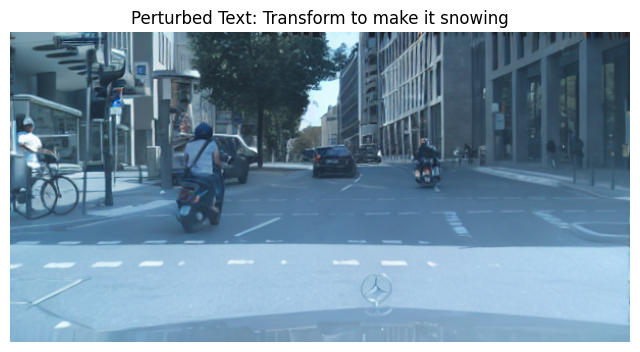

Image generation 50 complete with acceptable Wasserstein distance!


In [16]:
epsilon = 1e-6  # A small value to prevent division by zero
WD_dists_generated_vs_orig = []  # List to store Wasserstein distances

for i, perturbation in enumerate(Perturbations):
    # Generate new text for each perturbation
    perturbed_txt = perturb_text(text_list, perturbation, rng)
    corpus = ' '.join(perturbed_txt)
    
    # Set initial Wasserstein distances for generated image
    WD_dist_generated = float('inf')
    WD_dist_generated_vs_orig_value = float('inf')  # Distance between generated_image and orig_image (temporarily stored inside the loop)

    # Repeat generation process
    while WD_dist_generated > 0.07:  
        # Generate the original image (once, if not already generated)
        orig_image = pipe(
            prompt=corpus,  # Use the perturbed text
            image=init_image, 
            cfg_image=cfg_image, 
            cfg_text=cfg_text,
        ).images[0]

        # Generate another image (generated image)
        generated_image = pipe(
            prompt=corpus,  # Use the perturbed text
            image=init_image, 
            cfg_image=cfg_image, 
            cfg_text=cfg_text,
        ).images[0]

        # Extract embeddings for the generated image, original image, and initial image
        generated_embedding = extract_image_embedding(generated_image, processor, model)
        init_embedding = extract_image_embedding(init_image, processor, model)
        orig_embedding = extract_image_embedding(orig_image, processor, model)

        # Calculate Wasserstein distance between generated image and initial image
        WD_dist_generated = wasserstein_distance(generated_embedding, init_embedding)

        if WD_dist_generated > 0.07:
            print(f"Distance too large (WD_dist_generated = {WD_dist_generated}), regenerating image...")
            continue  # Go back to the beginning of the loop to regenerate the image

        # Calculate Wasserstein distance between generated image and original image
        WD_dist_generated_vs_orig_value = wasserstein_distance(generated_embedding, orig_embedding)

        # Store the Wasserstein distance between the generated image and the original image
        WD_dists_generated_vs_orig.append(WD_dist_generated_vs_orig_value)

        # Display the Wasserstein distances
        print(f"Perturbation {i + 1}:")
        print(f'Wasserstein distance (generated vs init): {WD_dist_generated}')
        print(f'Wasserstein distance (generated vs orig): {WD_dist_generated_vs_orig_value}')

        # Display the image only if the distance is acceptable
        plt.figure(figsize=(8, 8))
        plt.imshow(generated_image)
        plt.title(f"Perturbed Text: {corpus}", fontsize=12)
        plt.axis('off')  # Remove the axes
        plt.show()

        # Save the image to the output path if the distance is acceptable
        output_path = f'/kaggle/working/generated_image_{i + 1}.png'  # Set the output path for each image
        generated_image.save(output_path)
        print(f"Image generation {i + 1} complete with acceptable Wasserstein distance!")
        break  # Exit the loop if the image is acceptable


In [17]:
WD_dists_generated_vs_orig = np.array(WD_dists_generated_vs_orig)

# Step 1: Compute the inverse of the distances (add a small value to avoid division by zero)
epsilon = 1e-8  # Small value to prevent division by zero
inverse_distances = 1 / (WD_dists_generated_vs_orig + epsilon)

# Step 2: Scale the inverse distances between 0 and 1 (Min-Max scaling)
min_inv = np.min(WD_dists_generated_vs_orig)
max_inv = np.max(WD_dists_generated_vs_orig)

Similarities = (WD_dists_generated_vs_orig - min_inv) / (max_inv - min_inv)

# Now Similarities contains the scaled similarities between 0 and 1
print(Similarities)


[0.41405615 0.11250488 0.22627132 0.3401576  0.0713829  0.06023241
 0.22291202 0.35571279 0.05552382 0.50066516 0.14241848 0.05491744
 0.12369961 0.08344595 0.50281397 1.         0.17208021 0.
 0.30811028 0.10466069 0.38036254 0.35495886 0.04379548 0.10290351
 0.24180436 0.53038176 0.10711812 0.0477252  0.08606938 0.04871174
 0.1281377  0.45081044 0.07333395 0.09598559 0.28299212 0.32279012
 0.20716009 0.46747564 0.19640124 0.40300779 0.62514114 0.26069822
 0.29340631 0.0806545  0.09042856 0.49426582 0.38471616 0.60269764
 0.29787892 0.23276779]


<a id="top"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#003d99;overflow:hidden"><b>Compute WMD between texts & Vectors of 0,1</b></div>

In [18]:
wmd_scores = {}
all_texts = [prompt] + Responses  # Include the original text (prompt) and all responses (perturbed texts)

for idx, text in enumerate(Responses):  # Loop through all perturbed texts (Responses)
    wmd_score = model_txt.wmdistance(prompt, text)  # Compute WMD between prompt and perturbed text
    wmd_scores[f"Original vs Perturbed {idx+1}"] = wmd_score

# Display the WMD scores
print("WMD Scores:\n")
for key, value in wmd_scores.items():
    print(f"{key}: {value:.4f}")

# Assigning WMD scores to a variable 'distances' for future use
distances = wmd_scores

WMD Scores:

Original vs Perturbed 1: 0.3247
Original vs Perturbed 2: 0.2386
Original vs Perturbed 3: 0.1212
Original vs Perturbed 4: 0.2064
Original vs Perturbed 5: 0.4337
Original vs Perturbed 6: 0.1792
Original vs Perturbed 7: 0.6305
Original vs Perturbed 8: 0.2504
Original vs Perturbed 9: 0.3327
Original vs Perturbed 10: 0.1517
Original vs Perturbed 11: 0.2170
Original vs Perturbed 12: 0.3709
Original vs Perturbed 13: 0.2424
Original vs Perturbed 14: 0.2859
Original vs Perturbed 15: 0.0752
Original vs Perturbed 16: 0.3616
Original vs Perturbed 17: 0.2935
Original vs Perturbed 18: 0.4337
Original vs Perturbed 19: 0.2354
Original vs Perturbed 20: 0.4059
Original vs Perturbed 21: 0.4334
Original vs Perturbed 22: 0.1543
Original vs Perturbed 23: 0.3190
Original vs Perturbed 24: 0.1951
Original vs Perturbed 25: 0.1786
Original vs Perturbed 26: 0.4720
Original vs Perturbed 27: 0.1756
Original vs Perturbed 28: 0.3743
Original vs Perturbed 29: 0.4666
Original vs Perturbed 30: 0.2368
Origin

<a id="top"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#003d99;overflow:hidden"><b>Extract coefficiants</b></div>

In [19]:
Perturbations = np.vstack(Perturbations)
distance_values = np.array(list(distances.values()))

distance_values = np.array(list(distances.values()))

kernel_width = 0.25

# Compute weights based on the distances
weights = np.sqrt(np.exp(-(distance_values ** 2) / (kernel_width ** 2)))

# Fit a Linear Regression model
linear_model = LinearRegression()
linear_model.fit(X=Perturbations, y= Similarities, sample_weight=weights)

# Retrieve coefficients from the model
coefficients = linear_model.coef_

# Print the coefficients and weights
print("Coefficients from the Linear Regression model:", coefficients)
print("\nComputed Weights:", weights)


Coefficients from the Linear Regression model: [-2.02581354e-03 -8.65281824e-03 -6.55160517e-02  2.39692699e-02
 -1.93863950e-04 -2.67417123e-02  2.28590787e-01]

Computed Weights: [0.43012812 0.63426772 0.88904608 0.71126558 0.22206441 0.77339777
 0.04158266 0.60546318 0.4124566  0.83189554 0.68614149 0.33264794
 0.62503029 0.52000645 0.95578472 0.35128467 0.50194435 0.22206441
 0.64179588 0.26767287 0.22256671 0.82660896 0.44314984 0.73755261
 0.77487732 0.168211   0.78130641 0.32593863 0.17521084 0.63862278
 0.094873   0.71418867 0.58320461 0.72016192 0.75495126 0.41724279
 0.246783   0.48556525 0.41563157 0.72500171 0.41320021 0.64111725
 0.87325582 0.03740863 0.75427877 0.14063751 0.28925235 0.63005636
 0.73898962 0.67424747]


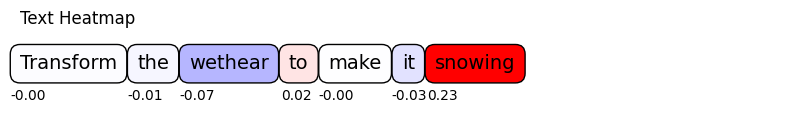

In [20]:
def plot_text_heatmap(words, scores, title="", width=10, height=0.4, verbose=0, max_word_per_line=20, word_spacing=20, score_fontsize=10, save_path=None):
    fig = plt.figure(figsize=(width, height))
    ax = plt.gca()
    ax.set_title(title, loc='left')
    cmap = plt.cm.ScalarMappable(cmap=plt.cm.bwr)
    cmap.set_clim(0, 1)
    canvas = ax.figure.canvas
    t = ax.transData
    normalized_scores = 0.5 * scores / np.max(np.abs(scores)) + 0.5
    loc_y = -0.2
    for i, (token, score) in enumerate(zip(words, scores)):
        *rgb, _ = cmap.to_rgba(normalized_scores[i], bytes=True)
        color = '#%02x%02x%02x' % tuple(rgb)
        text = ax.text(0.0, loc_y, token, bbox={'facecolor': color, 'pad': 5.0, 'linewidth': 1, 'boxstyle': 'round,pad=0.5'}, transform=t, fontsize=14)
        text.draw(canvas.get_renderer())
        ex = text.get_window_extent()
        score_text = ax.text(0.01, loc_y - 1, f"{score:.2f}", transform=t, fontsize=score_fontsize, ha='center')
        score_text.draw(canvas.get_renderer())
        ex_score = score_text.get_window_extent()
        if (i+1) % max_word_per_line == 0:
            loc_y = loc_y - 2.5
            t = ax.transData
        else:
            t = transforms.offset_copy(text._transform, x=ex.width + word_spacing, units='dots')
    if verbose == 0:
        ax.axis('off')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()
    words = "make this image snowy.".split(' ')
# Define the save path for Kaggle output
save_path = '/kaggle/working/text_heatmap.png'

# Call the function with the save_path
plot_text_heatmap(words, coefficients, title="Text Heatmap", save_path=save_path)

<a id="top"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:center;display:fill;border-radius:5px;background-color:#003d99;overflow:hidden"><b>Compute Fidelity</b></div>

In [ ]:
y_true = np.array(Similarities).ravel()
y_pred = linear_model.predict(Perturbations).ravel()

In [ ]:
# Calculate regression metrics
mse = mean_squared_error(y_true, y_pred, sample_weight=weights)
r2 = r2_score(y_true, y_pred, sample_weight=weights)
mae = mean_absolute_error(y_true, y_pred, sample_weight=weights)

# Mean loss (Lm)
mean_loss_f = np.mean(y_true)
mean_loss_g = np.mean(y_pred)
mean_loss = abs(mean_loss_f - mean_loss_g)

# Mean L1 and L2 loss
mean_l1 = np.mean(np.abs(y_true - y_pred))
mean_l2 = np.mean((y_true - y_pred) ** 2)

# Weighted L1 and L2 loss
n = len(y_true)
weighted_l1 = np.sum(weights * np.abs(y_true - y_pred)) / n
weighted_l2 = np.sum(weights * (y_true - y_pred) ** 2) / n

# Weighted R²
f_mean = np.average(y_true, weights=weights)
ss_tot = np.sum(weights * (y_true - f_mean) ** 2)
ss_res = np.sum(weights * (y_true - y_pred) ** 2)
weighted_r2 = 1 - ss_res / ss_tot

# Weighted adjusted R²
p = len(coefficients)
weighted_adj_r2 = 1 - (1 - weighted_r2) * (n - 1) / (n - p - 1)

# Store metrics
metrics = {
    "name": model_name,
    "num_clusters": num_perturb,
    "mse": mse,
    "r2": r2,
    "mae": mae,
    "mean_loss": mean_loss,
    "mean_l1": mean_l1,
    "mean_l2": mean_l2,
    "weighted_l1": weighted_l1,
    "weighted_l2": weighted_l2,
    "weighted_r2": weighted_r2,
    "weighted_adj_r2": weighted_adj_r2
}

# Print fidelity metrics
print(100 * '-')
print('Fidelity:')
print(f"Mean Squared Error (MSE): {mse}")
print(f"R-squared (R²): {r2}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Loss (Lm): {mean_loss}")
print(f"Mean L1 Loss: {mean_l1}")
print(f"Mean L2 Loss: {mean_l2}")
print(f"Weighted L1 Loss: {weighted_l1}")
print(f"Weighted L2 Loss: {weighted_l2}")
print(f"Weighted R-squared (R²ω): {weighted_r2}")
print(f"Weighted Adjusted R-squared (Rˆ²ω): {weighted_adj_r2}")
print(100 * '-')

In [ ]:
# Calculate the R² score
r2 = r2_score(y_true, y_pred, sample_weight=weights)

# Normalize weights for better visualization (optional)
normalized_weights = np.array(weights) / np.max(weights) * 100  # Scale weights to a reasonable range for point sizes

# Plotting
fig, ax = plt.subplots()
ax.scatter(y_true, y_pred, s=normalized_weights, label='Data points', alpha=0.6)  # Use weights for point sizes

# Determine the range for the perfect prediction line
min_val = min(y_true.min(), y_pred.min())
max_val = max(y_true.max(), y_pred.max())

# Plotting the Perfect Prediction Line (y = x)
ax.plot([min_val, max_val], [min_val, max_val], 'k--', lw=2, label='Perfect Prediction Line')

# Set the plot limits to better frame the data
ax.set_xlim([min_val, max_val])
ax.set_ylim([min_val, max_val])

# Labeling the axes
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')

# Title with R² score rounded to two decimal places
ax.set_title(f'Actual vs. Predicted Values\nR²: {r2:.2f}')

# Show legend
ax.legend()
# Define the save path for Kaggle output
save_path = '/kaggle/working/actual_vs_predicted_plot.png'

# Save the plot to the specified path
plt.savefig(save_path, bbox_inches='tight')
# Show plot
plt.show()